In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# Install nibabel, a package required for NIfTI image manipulation, if it's not already available in the environment.
!pip install nibabel

import os
import numpy as np

import sys

import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D,Conv2DTranspose, MaxPooling2D, UpSampling2D, concatenate, BatchNormalization, Activation, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.optimizers import Adam

from keras import losses

import nibabel as nib
import matplotlib.pyplot as plt

In [3]:
data_dir = '/content/drive/My Drive/nii_images/'
label_dir = '/content/drive/My Drive/nii_segmentations/'

**Hyper Parameters**

In [4]:
bachSize = 64
epochsSize = 30
zeroValuePixel = 0.0
threshold = 0.275
optimizer = 'adam'
learning_rate = 0.001
#optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

**Other Parameters**

In [5]:
images_count = 51
cropx = 150
cropy = 50


**Progress Bar**

In [6]:
def progress_bar(progress, total):
    percentage = (progress / total) * 100
    bar = ('█' * int(percentage)) + ('-' * (100 - int(percentage)))
    print(f"\r|{bar}| {percentage:.2f}%")
    return

**Loss Functions**

In [7]:

def weighted_bincrossentropy(true, pred, weight_zero = 0.625, weight_one = 2):

    # calculate the binary cross entropy

    bin_crossentropy = tf.keras.backend.binary_crossentropy(true, pred)
    # apply the weights
    weights = true * weight_one + (1. - true) * weight_zero
    weighted_bin_crossentropy = weights * bin_crossentropy

    return tf.keras.backend.mean(weighted_bin_crossentropy)

In [8]:
def dice_loss(y_true, y_pred, smooth=1e-6):

    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def combined_loss(y_true, y_pred):
    return losses.binary_crossentropy(y_true, y_pred) +  dice_loss(y_true, y_pred)

**Load NII Images**

In [9]:
def load_nii_image(filepath):
    """Load a NIfTI image and normalize it."""
    img = nib.load(filepath).get_fdata()
    min_val = np.min(img)
    max_val = np.max(img)
    normalized = ((img - min_val) / (max_val - min_val))
    normalized = normalized[cropy:cropy+256, cropx:cropx+256, :]  # Crop the image
    return normalized

# Update the optimizer with a specific learning rate
#optimizer = Adam(learning_rate=learning_rates)

In [10]:
def load_nii_Hu_image(filepath):
    img = nib.load(filepath).get_fdata()
    window_center = 60
    window_width = 12
    lower_bound = window_center - (window_width / 2)
    upper_bound = window_center + (window_width / 2)

    img_windowed = np.clip(img, lower_bound, upper_bound)

    # Normalize to [0, 1]
    img_normalized = (img_windowed - lower_bound) / (upper_bound - lower_bound)
    normalized = img_normalized[cropy:cropy+256, cropx:cropx+256, :]  # Crop the image
    return normalized

In [11]:
import tensorflow.keras.metrics as Metrics


**Define a callback to save model weights after each iteration (batch)**

In [12]:
model_checkpoint = ModelCheckpoint(filepath="model_weights_{epoch:02d}.h5", save_weights_only=True)

def unet_model(input_size):
    inputs = Input(input_size)

    c0 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    p0 = MaxPooling2D((2, 2))(c0)
    print(c0.shape)

    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(p0)
    p1 = MaxPooling2D((2, 2))(c1)
    print(c1.shape)

    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    p2 = MaxPooling2D((2, 2))(c2)
    print(c2.shape)

    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    p3 = MaxPooling2D((2, 2))(c3)
    print(c3.shape)

    c4 = Conv2D(256, (3, 3), activation='relu', padding='same')(p3)
    p4 = MaxPooling2D((2, 2))(c4)
    print(c4.shape)

    c5 = Conv2D(512, (3, 3), activation='relu', padding='same')(p4)

    # Upward path
    u2 = UpSampling2D((2, 2))(c5)
    print(c5.shape)
    merge2 = concatenate([u2, c4])
    c6 = Conv2D(256, (3, 3), activation='relu', padding='same')(merge2)

    # Upward path
    u3 = UpSampling2D((2, 2))(c6)
    print(c6.shape)
    merge3 = concatenate([u3, c3])
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(merge3)
    print(c7.shape)

    u4 = UpSampling2D((2, 2))(c7)
    merge4 = concatenate([u4, c2])
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(merge4)
    print(c8.shape)

    u5 = UpSampling2D((2, 2))(c8)
    merge5 = concatenate([u5, c1])
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(merge5)
    print(c9.shape)

    u6 = UpSampling2D((2, 2))(c9)
    merge6 = concatenate([u6, c0])
    c10 = Conv2D(32, (3, 3), activation='relu', padding='same')(merge6)
    print(c10.shape)

    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c10)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model





In [13]:
imagesToExculde = [47,38,34,41,32,50]
images, masks = [], []
for i in range(images_count):
    # Load image and mask
    if (imagesToExculde.__contains__(i)): continue
    progress_bar(i,images_count)
    img = load_nii_image(os.path.join(data_dir, f"volume-{i}.nii")).squeeze()  # Squeeze to reduce to 255x255
    imgHu = load_nii_Hu_image(os.path.join(data_dir, f"volume-{i}.nii")).squeeze()  # Squeeze to reduce to 255x255
    mask = load_nii_image(os.path.join(label_dir, f"segmentation-{i}.nii")).squeeze()  # Squeeze to reduce to 255x255

    for j in range(mask.shape[2]):
        # Process each slice of the mask
        mask_slice = mask[:,:,j]
        imgHu_slice = imgHu[:,:,j]
        img_slice = img[:,:,j]

          # Create a binary mask: 0 where mask is 0, 1 elsewhere
        binary_mask = np.where(mask_slice > 0.0, 1.0, 0.0)
        mask_slice = np.where(mask_slice > 0.0, 1.0, 0)

        # Check if more than a certain threshold of values are non-zero in the binary mask
        if np.sum(binary_mask) / (mask_slice.shape[0] * mask_slice.shape[1]) > threshold:
            # Stack the image slice and the binary mask to create a 255x255x3 image
            stacked_image = np.stack([img_slice, imgHu_slice], axis=-1)

            images.append(stacked_image)
            masks.append(mask_slice)  # Append the original mask slice if needed.
    print(len(masks))
images = np.array(images)[..., np.newaxis]  # Add a channel dimension
masks = np.array(masks)[..., np.newaxis]

|----------------------------------------------------------------------------------------------------| 0.00%
15
|█---------------------------------------------------------------------------------------------------| 1.96%
31
|███-------------------------------------------------------------------------------------------------| 3.92%
121
|█████-----------------------------------------------------------------------------------------------| 5.88%
196
|███████---------------------------------------------------------------------------------------------| 7.84%
320
|█████████-------------------------------------------------------------------------------------------| 9.80%
363
|███████████-----------------------------------------------------------------------------------------| 11.76%
424
|█████████████---------------------------------------------------------------------------------------| 13.73%
515
|███████████████--------------------------------------------------------------------------------

In [14]:
import tensorflow as tf

class BinaryDiceScore(tf.keras.metrics.Metric):
    def __init__(self, smooth=1e-6, name='dice_score', **kwargs):
        super(BinaryDiceScore, self).__init__(name=name, **kwargs)
        self.smooth = smooth
        self.dice_score = self.add_weight(name='dice', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.cast(y_true, tf.float32)
        y_pred = tf.cast(y_pred, tf.float32)
        intersection = tf.reduce_sum(y_true * y_pred)
        union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
        dice = (2. * intersection + self.smooth) / (union + self.smooth)
        self.dice_score.assign(dice)

    def result(self):
        return self.dice_score

    def reset_states(self):
        self.dice_score.assign(0.0)



Process each slice separately

In [15]:

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(images, masks, test_size=0.2, random_state=42)

In [16]:
model = unet_model((256, 256, 2))
model.compile(optimizer=optimizer, loss=dice_loss, metrics=['accuracy',BinaryDiceScore()])
model.fit(X_train, y_train, batch_size=bachSize, epochs=epochsSize, validation_split=0.2)

(None, 256, 256, 32)
(None, 128, 128, 64)
(None, 64, 64, 128)
(None, 32, 32, 256)
(None, 16, 16, 256)
(None, 8, 8, 512)
(None, 16, 16, 256)
(None, 32, 32, 256)
(None, 64, 64, 128)
(None, 128, 128, 64)
(None, 256, 256, 32)
Epoch 1/30
28/28 [==============================] - ETA: 0s - loss: 0.5236 - accuracy: 0.5644 - dice_score: 0.7685

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:2723: UserWarning: Metric BinaryDiceScore implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


28/28 [==============================] - 26s 380ms/step - loss: 0.5236 - accuracy: 0.5644 - dice_score: 0.7685 - val_loss: 0.2219 - val_accuracy: 0.8100 - val_dice_score: 0.7764
Epoch 2/30
28/28 [==============================] - 4s 127ms/step - loss: 0.1685 - accuracy: 0.8553 - dice_score: 0.8977 - val_loss: 0.1317 - val_accuracy: 0.8834 - val_dice_score: 0.8701
Epoch 3/30
28/28 [==============================] - 4s 128ms/step - loss: 0.1027 - accuracy: 0.9142 - dice_score: 0.9325 - val_loss: 0.0966 - val_accuracy: 0.9191 - val_dice_score: 0.9125
Epoch 4/30
28/28 [==============================] - 4s 128ms/step - loss: 0.0831 - accuracy: 0.9306 - dice_score: 0.9422 - val_loss: 0.0785 - val_accuracy: 0.9346 - val_dice_score: 0.9301
Epoch 5/30
28/28 [==============================] - 4s 128ms/step - loss: 0.0624 - accuracy: 0.9474 - dice_score: 0.9422 - val_loss: 0.0635 - val_accuracy: 0.9470 - val_dice_score: 0.9447
Epoch 6/30
28/28 [==============================] - 4s 128ms/step - lo

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


**Plot Results**

In [17]:
from matplotlib.colors import NoNorm
def plot_results(original, truth, prediction):
    difference = np.abs(truth - prediction)

    fig, ax = plt.subplots(1, 6, figsize=(20, 10))

    ax[0].imshow(original[:,:,0], cmap='gray',norm=NoNorm())
    ax[0].set_title("Original Image")

    ax[1].imshow(original[:,:,1], cmap='gray',norm=NoNorm())
    ax[1].set_title("hu Image")

    ax[2].imshow(truth[..., 0], cmap='gray',norm=NoNorm())
    ax[2].set_title("Ground Truth Mask")

    ax[3].imshow(prediction[..., 0], cmap='gray',norm=NoNorm())
    ax[3].set_title("Predicted Mask")

    ax[4].imshow(difference[..., 0], cmap='gray',norm=NoNorm())
    ax[4].set_title("Difference")

    for a in ax:
        a.axis('off')

    plt.show()

18/18 [==============================] - 2s 50ms/step


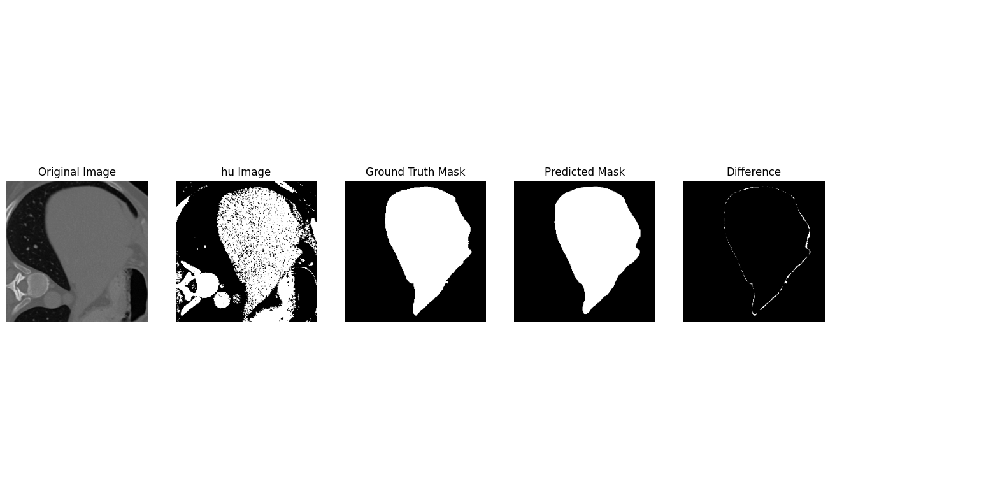

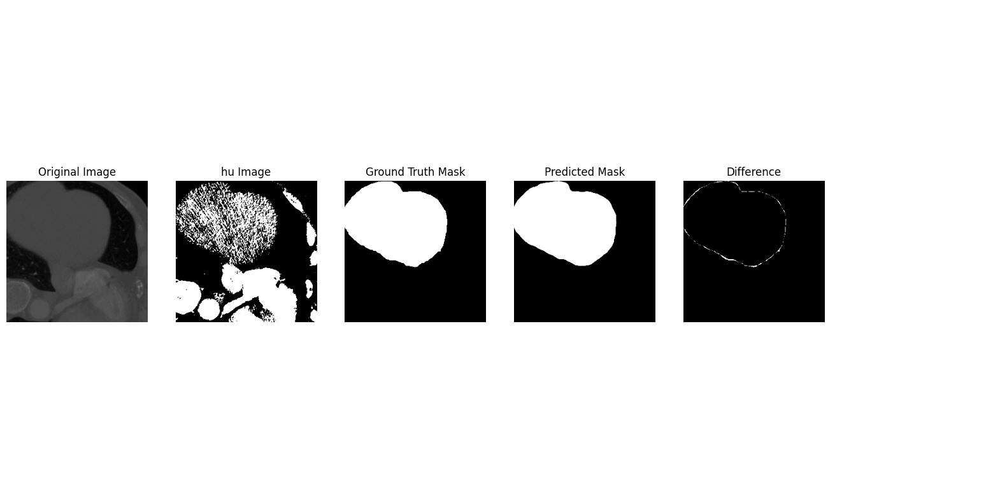

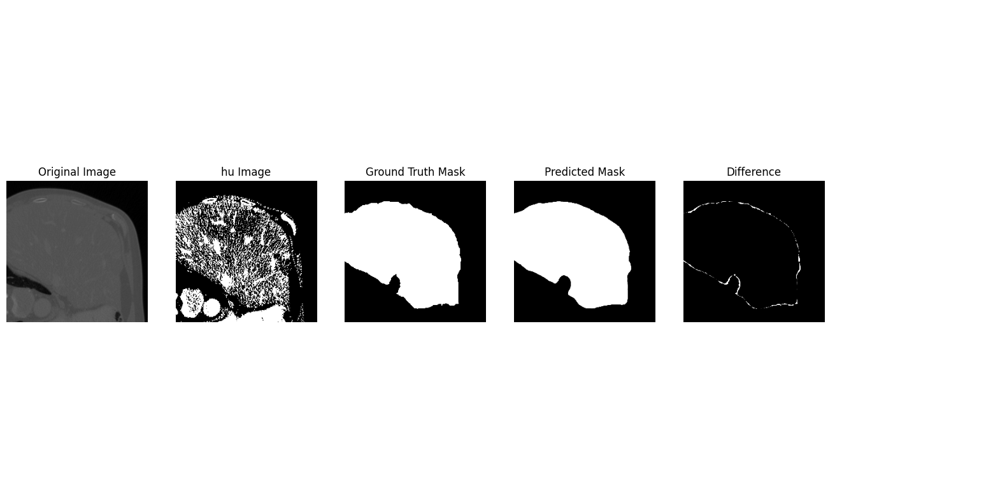

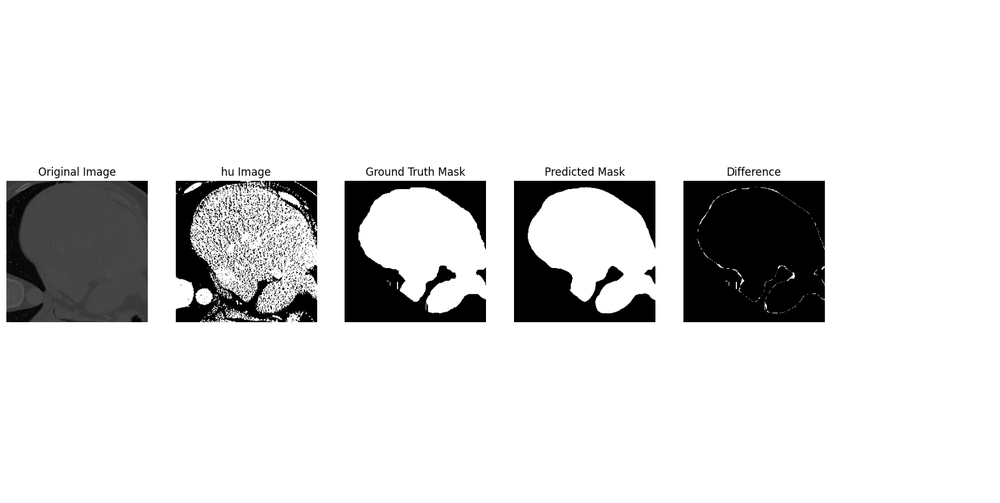

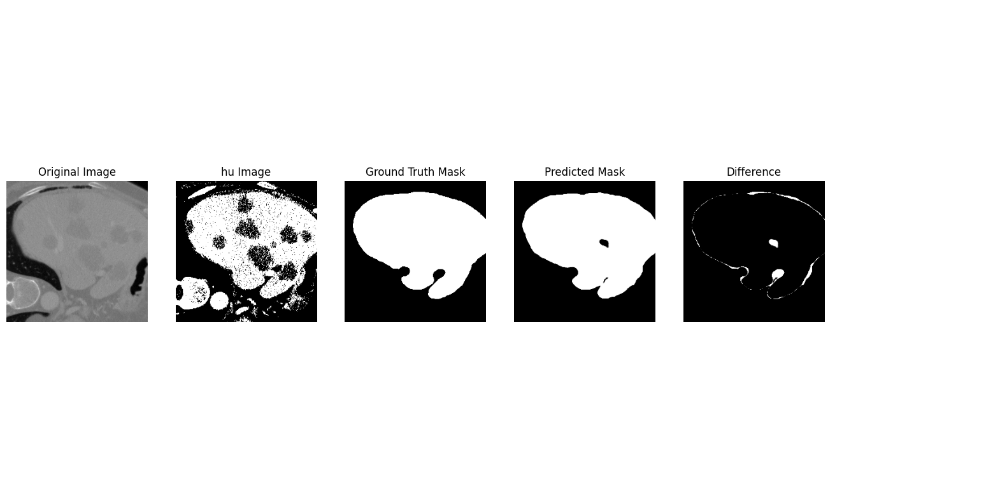

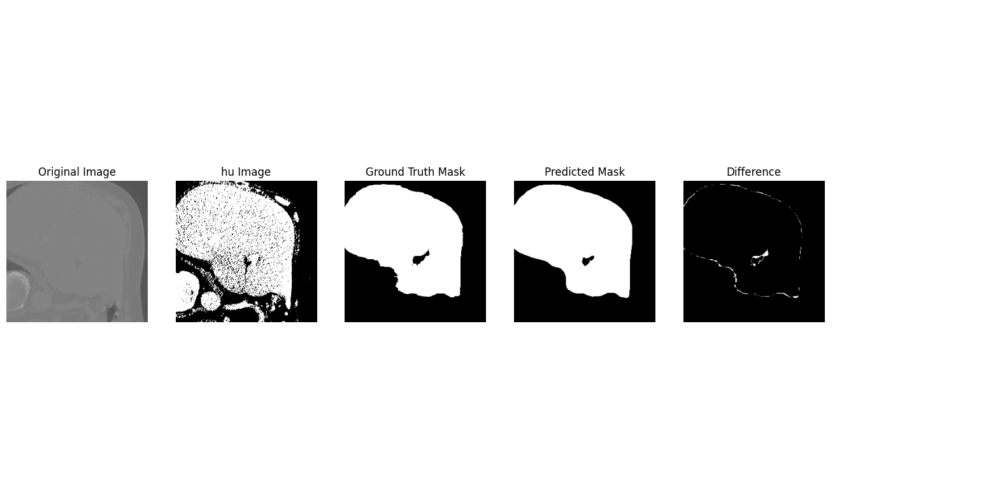

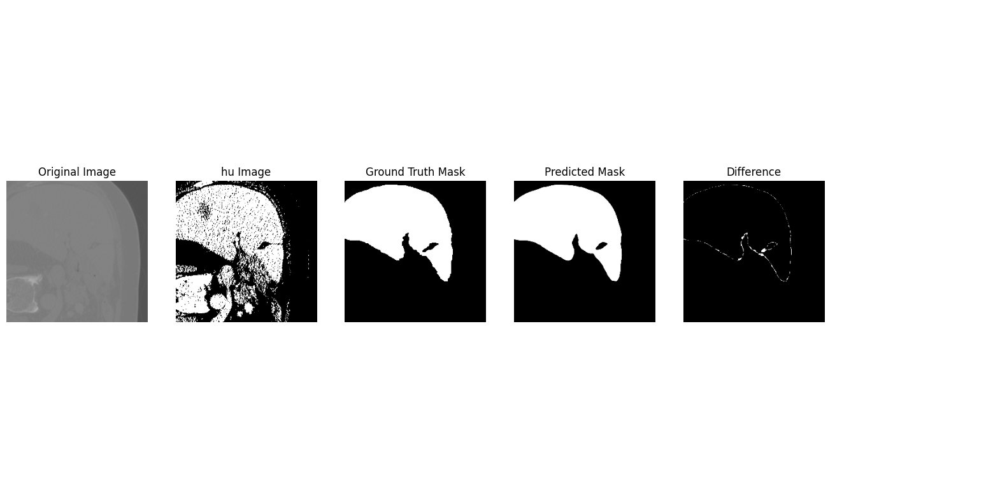

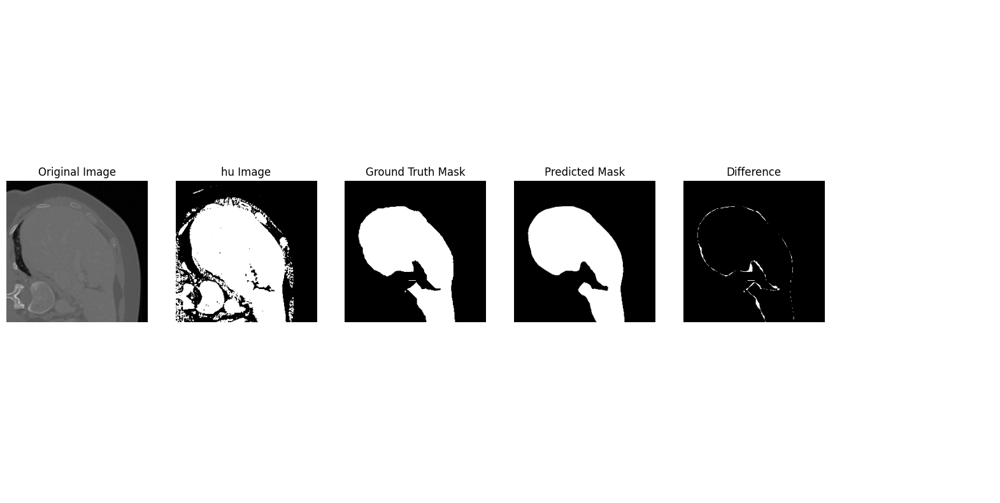

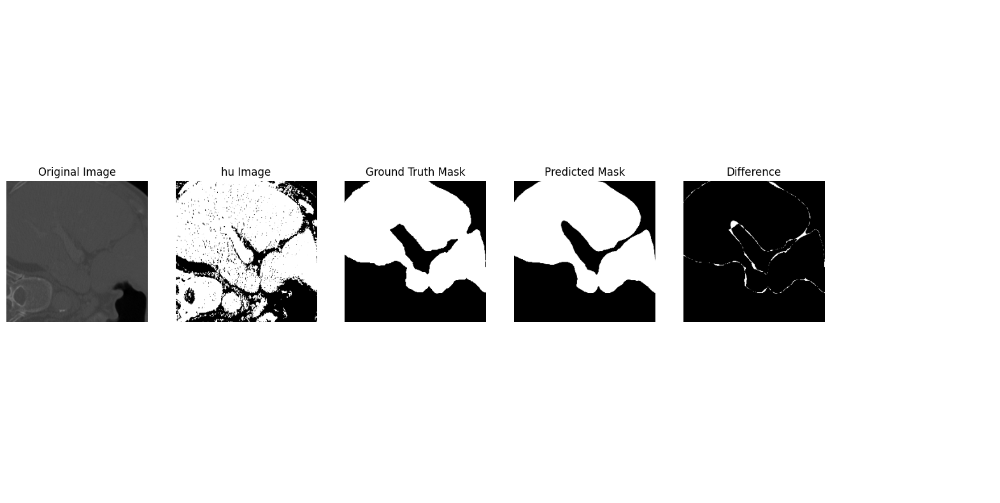

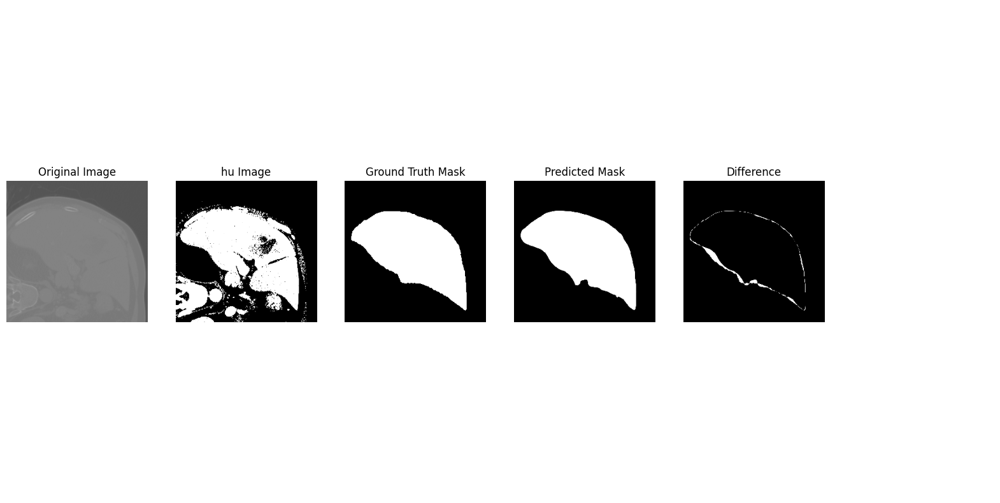

In [18]:
y_pred = model.predict(X_test)  # assuming X_val is your validation/test data

for i in range(70,80):
    plot_results(X_test[i], y_test[i], y_pred[i])

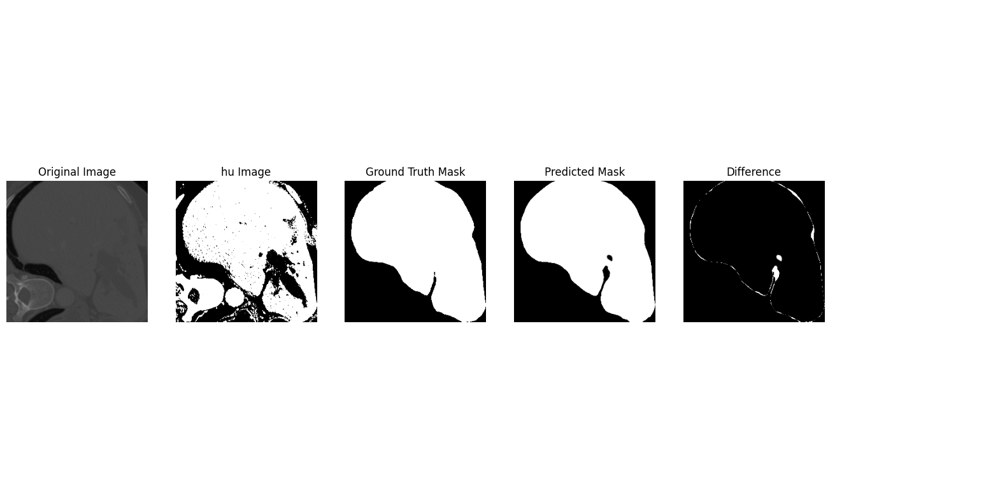

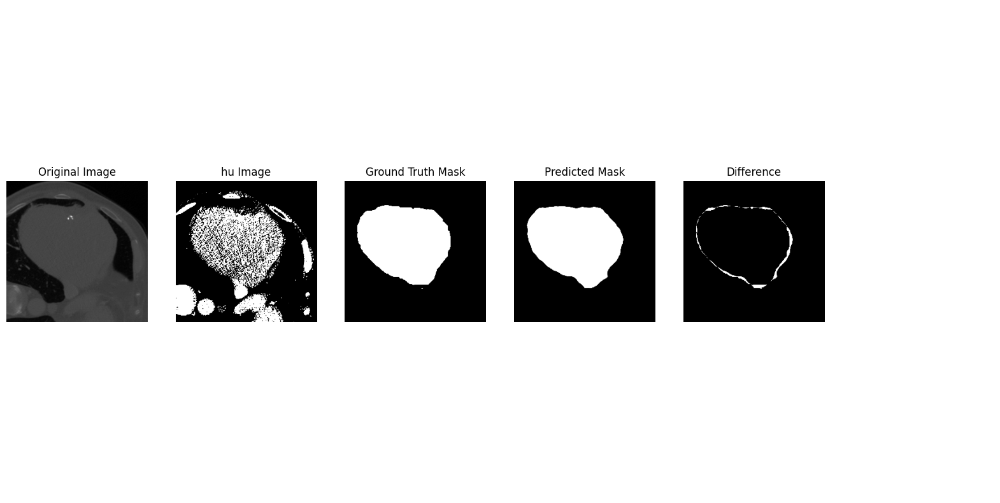

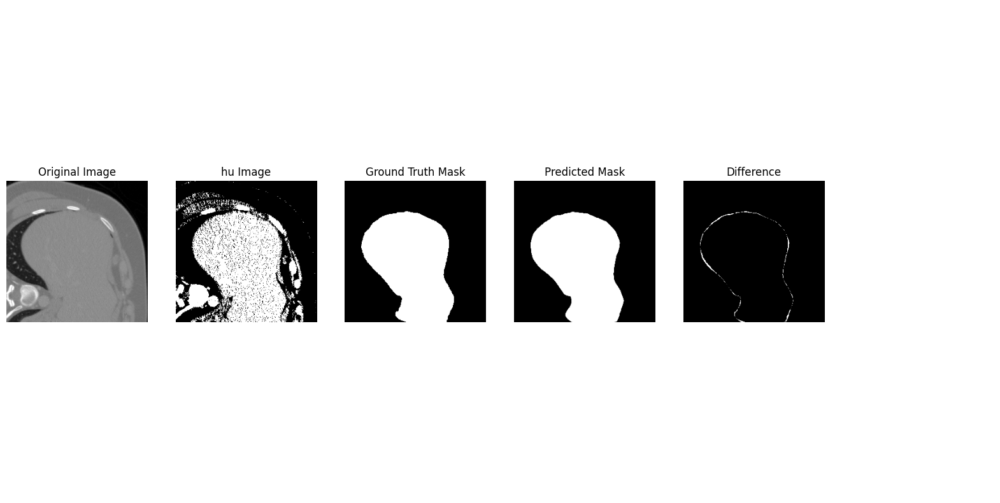

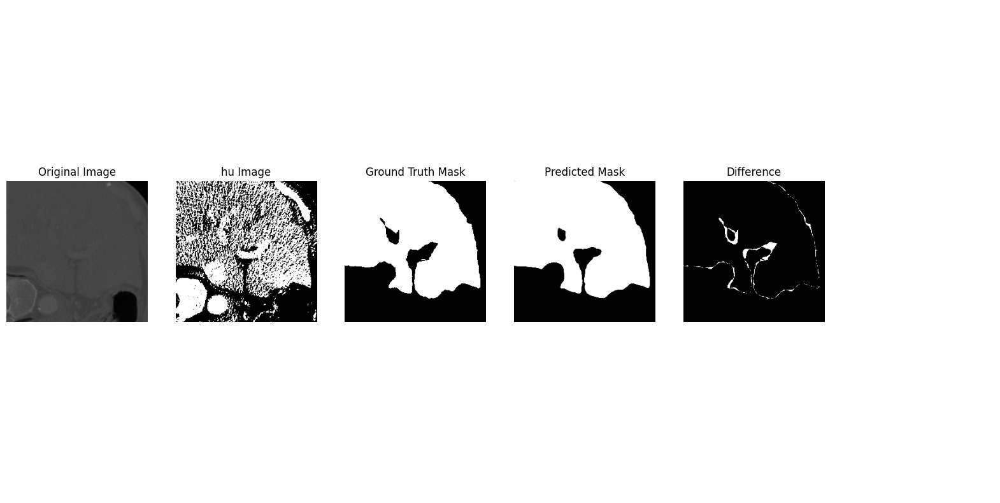

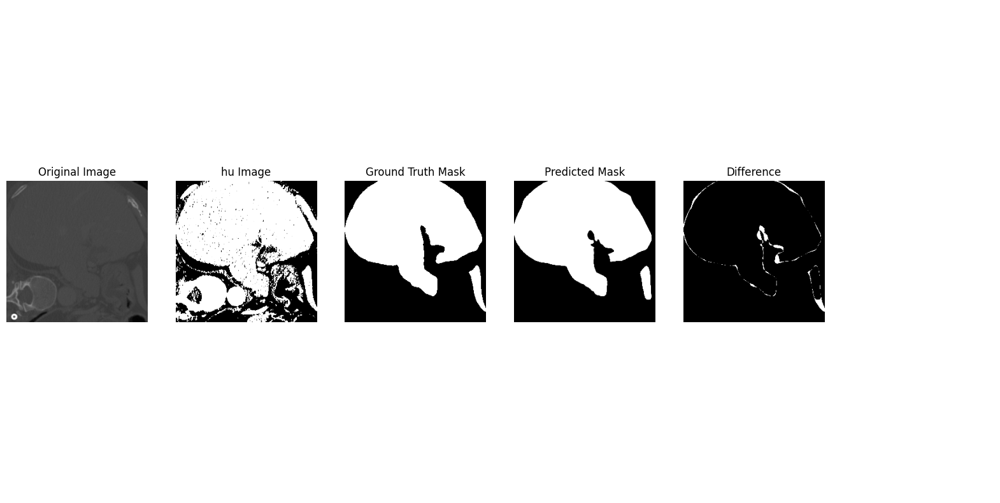

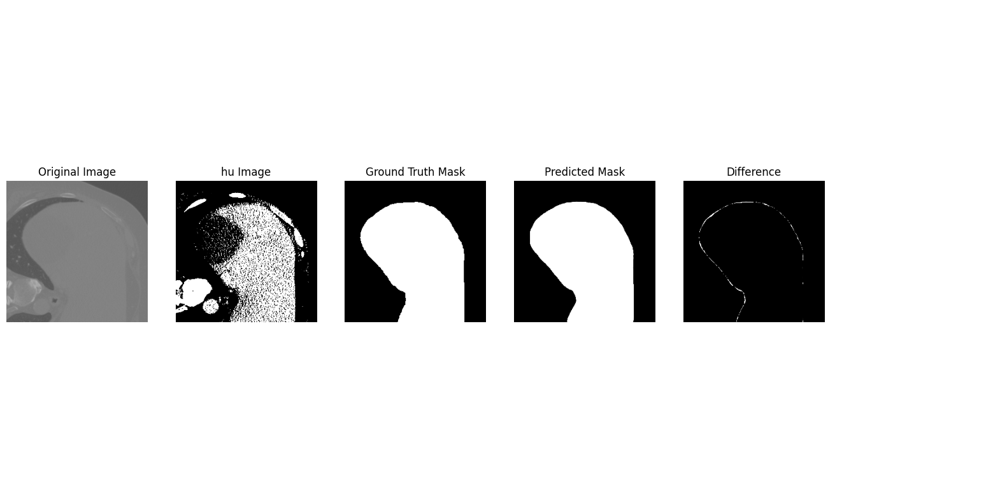

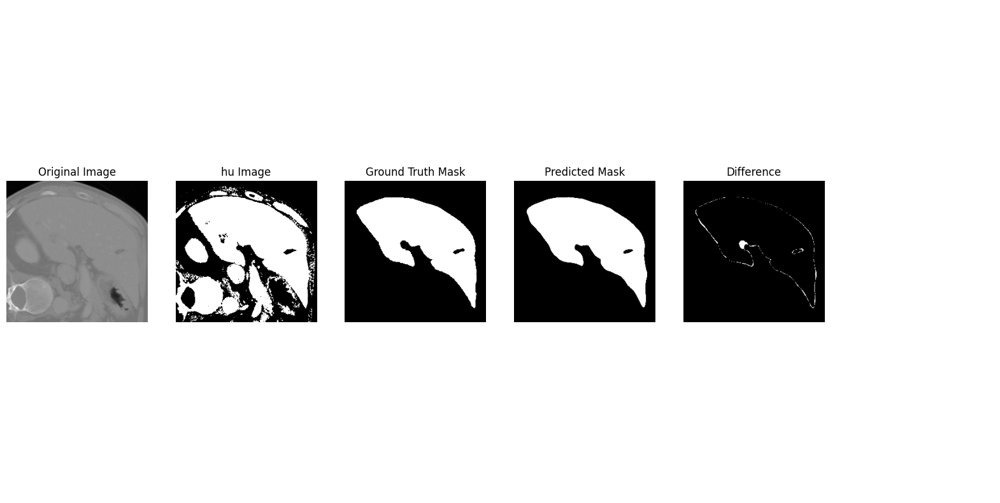

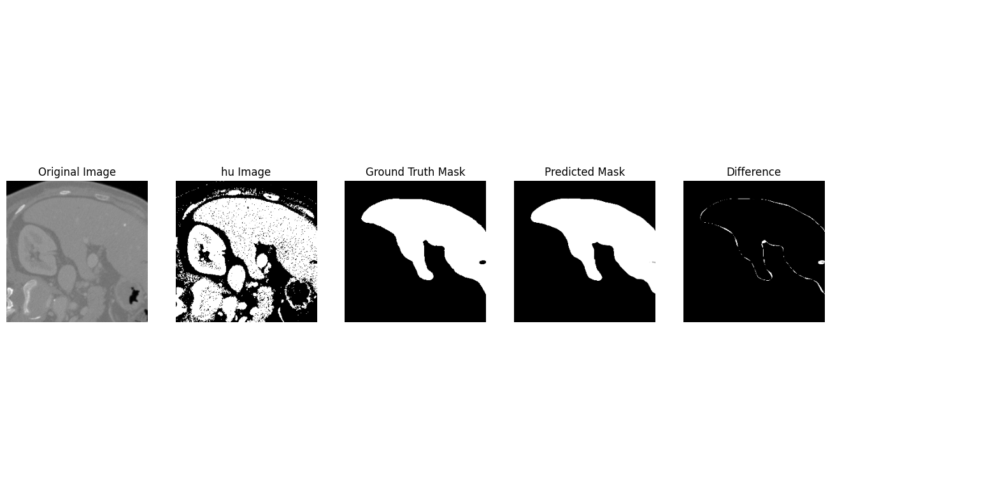

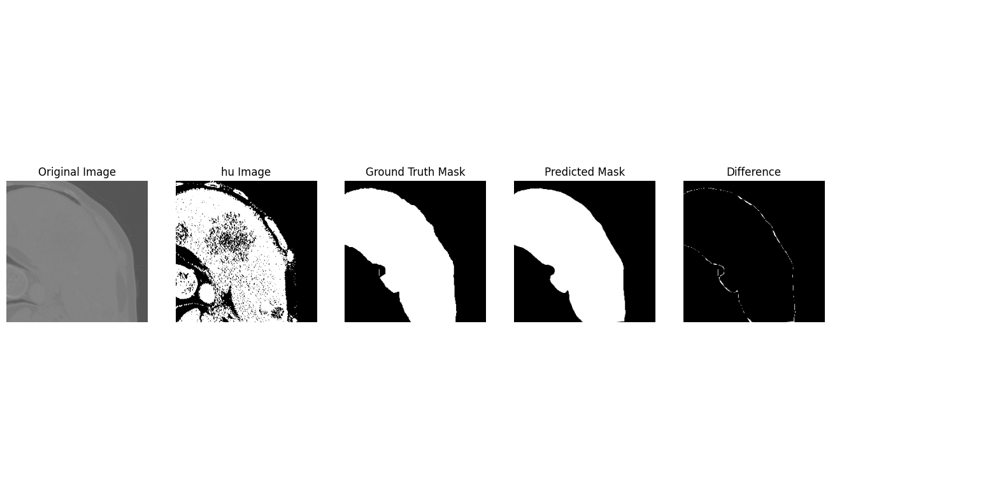

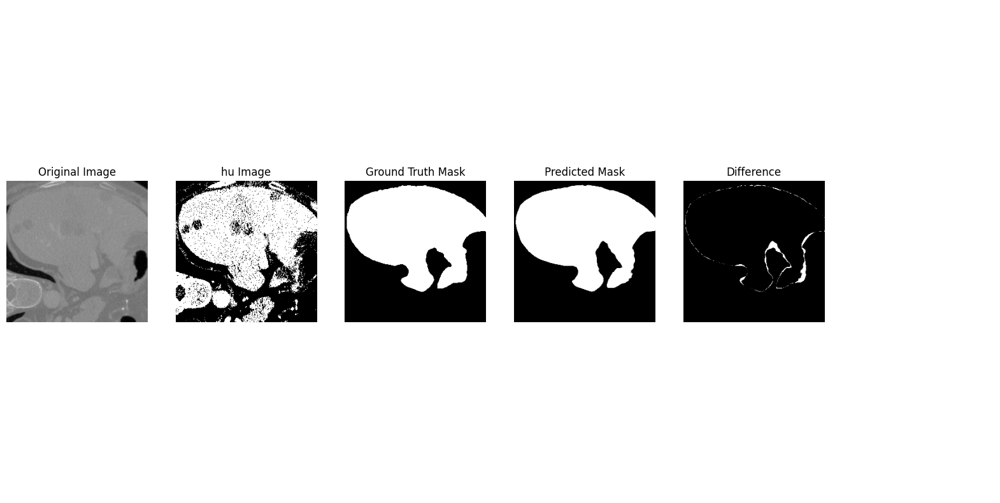

In [19]:
for i in range(200,210):
    plot_results(X_test[i], y_test[i], y_pred[i])

In [20]:
from matplotlib.colors import NoNorm
def plot_results(original, truth, prediction):
    difference = np.abs(truth - prediction)

    fig, ax = plt.subplots(1, 6, figsize=(20, 10))

    ax[0].imshow(original[:,:,0], cmap='gray',norm=NoNorm())
    ax[0].set_title("Original Image")

    ax[1].imshow(original[:,:,1], cmap='gray',norm=NoNorm())
    ax[1].set_title("hu Image")

    ax[2].imshow(original[:,:,2], cmap='gray',norm=NoNorm())
    ax[2].set_title("liver Image")

    ax[3].imshow(truth[..., 0], cmap='gray',norm=NoNorm())
    ax[3].set_title("Ground Truth Mask")

    ax[4].imshow(prediction[..., 0], cmap='gray',norm=NoNorm())
    ax[4].set_title("Predicted Mask")

    ax[5].imshow(difference[..., 0], cmap='gray',norm=NoNorm())
    ax[5].set_title("Difference")

    for a in ax:
        a.axis('off')

    plt.show()

In [21]:
imagesc, masksc = [], []
for i in range(images_count):
    if (imagesToExculde.__contains__(i)): continue
    # Load image and mask
    progress_bar(i,images_count)
    img = load_nii_image(os.path.join(data_dir, f"volume-{i}.nii")).squeeze()  # Squeeze to reduce to 255x255
    imgHu = load_nii_Hu_image(os.path.join(data_dir, f"volume-{i}.nii")).squeeze()  # Squeeze to reduce to 255x255
    mask = load_nii_image(os.path.join(label_dir, f"segmentation-{i}.nii")).squeeze()  # Squeeze to reduce to 255x255


    for j in range(mask.shape[2]):
        # Process each slice of the mask
        mask_slice = mask[:,:,j]
        imgHu_slice = imgHu[:,:,j]
        img_slice = img[:,:,j]

          # Create a binary mask: 0 where mask is 0, 1 elsewhere
        binary_mask = np.where(mask_slice > 0.0, 1.0, 0.0)
        mask_slice = np.where(mask_slice < 1.0, 0.0, 1.0)
        liver = []
        # Check if more than a certain threshold of values are non-zero in the binary mask
        if np.sum(binary_mask) / (mask_slice.shape[0] * mask_slice.shape[1]) > threshold:
            # Stack the image slice and the binary mask to create a 255x255x3 image
            liver.append(np.stack([img_slice, imgHu_slice], axis=-1))
            liver = np.array(liver)[..., np.newaxis]
            binary_mask1 = model.predict(liver)
            stacked_image = np.stack([img_slice, imgHu_slice, binary_mask1[0, :, :, 0]], axis=-1)

            imagesc.append(stacked_image)
            masksc.append(mask_slice)  # Append the original mask slice if needed.
    print(len(masks))
imagesc = np.array(imagesc)[..., np.newaxis]  # Add a channel dimension
masksc = np.array(masksc)[..., np.newaxis]


|----------------------------------------------------------------------------------------------------| 0.00%
1/1 [==============================] - 0s 21ms/step
2737
|█---------------------------------------------------------------------------------------------------| 1.96%
1/1 [==============================] - 0s 21ms/step
2737
|███-------------------------------------------------------------------------------------------------| 3.92%
1/1 [==============================] - 0s 23ms/step
2737
|█████-----------------------------------------------------------------------------------------------| 5.88%
1/1 [==============================] - 0s 22ms/step
2737
|███████---------------------------------------------------------------------------------------------| 7.84%
1/1 [==============================] - 0s 22ms/step
2737
|█████████-------------------------------------------------------------------------------------------| 9.80%
1/1 [==============================] - 0s 21ms/step
2737
|███

In [22]:
X_train, X_test, y_train, y_test = train_test_split(imagesc, masksc, test_size=0.2, random_state=42)

In [23]:
model1 = unet_model((256, 256, 3))
model1.compile(optimizer=optimizer, loss=combined_loss, metrics=['accuracy',BinaryDiceScore()])
model1.fit(X_train, y_train, batch_size=bachSize, epochs=30, validation_split=0.2,callbacks=model_checkpoint)


(None, 256, 256, 32)
(None, 128, 128, 64)
(None, 64, 64, 128)
(None, 32, 32, 256)
(None, 16, 16, 256)
(None, 8, 8, 512)
(None, 16, 16, 256)
(None, 32, 32, 256)
(None, 64, 64, 128)
(None, 128, 128, 64)
(None, 256, 256, 32)
Epoch 1/30
28/28 [==============================] - ETA: 0s - loss: 1.1252 - accuracy: 0.9662 - dice_score: 0.1753

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:2723: UserWarning: Metric BinaryDiceScore implements a `reset_states()` method; rename it to `reset_state()` (without the final "s"). The name `reset_states()` has been deprecated to improve API consistency.
  m.reset_state()


28/28 [==============================] - 10s 175ms/step - loss: 1.1252 - accuracy: 0.9662 - dice_score: 0.1753 - val_loss: 0.8898 - val_accuracy: 0.9869 - val_dice_score: 0.1605
Epoch 2/30
28/28 [==============================] - 4s 137ms/step - loss: 0.7563 - accuracy: 0.9834 - dice_score: 0.1003 - val_loss: 0.8145 - val_accuracy: 0.9649 - val_dice_score: 0.2092
Epoch 3/30
28/28 [==============================] - 4s 136ms/step - loss: 0.5968 - accuracy: 0.9846 - dice_score: 0.6405 - val_loss: 0.6644 - val_accuracy: 0.9823 - val_dice_score: 0.4868
Epoch 4/30
28/28 [==============================] - 4s 137ms/step - loss: 0.5274 - accuracy: 0.9879 - dice_score: 0.2102 - val_loss: 0.6532 - val_accuracy: 0.9841 - val_dice_score: 0.4372
Epoch 5/30
28/28 [==============================] - 4s 138ms/step - loss: 0.4879 - accuracy: 0.9898 - dice_score: 0.7723 - val_loss: 0.5435 - val_accuracy: 0.9912 - val_dice_score: 0.5889
Epoch 6/30
28/28 [==============================] - 4s 137ms/step - lo

18/18 [==============================] - 1s 26ms/step


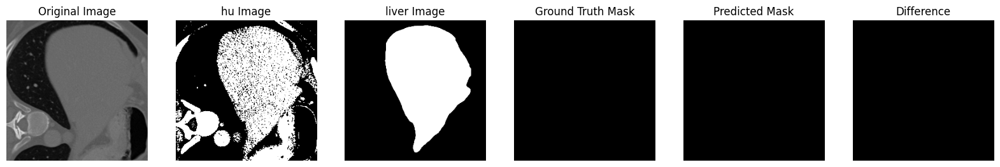

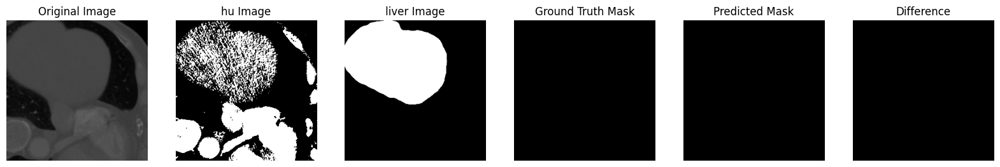

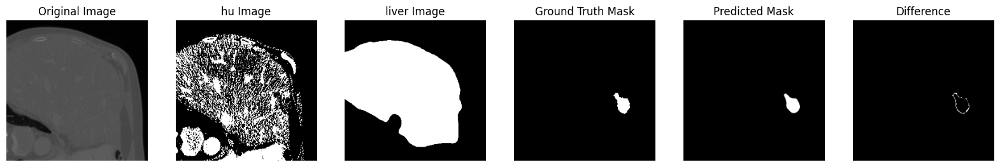

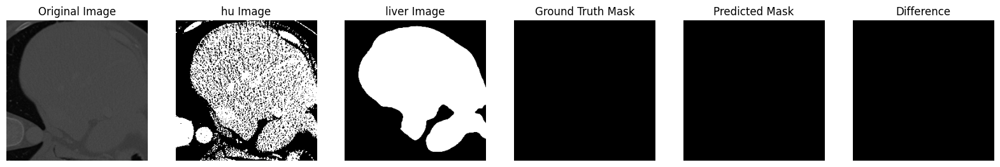

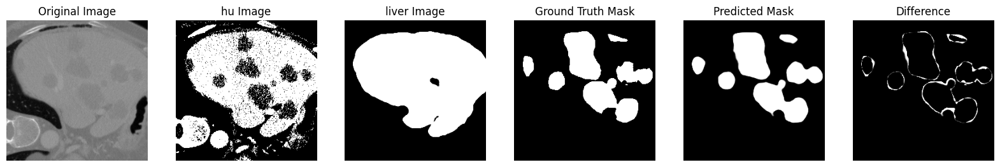

...

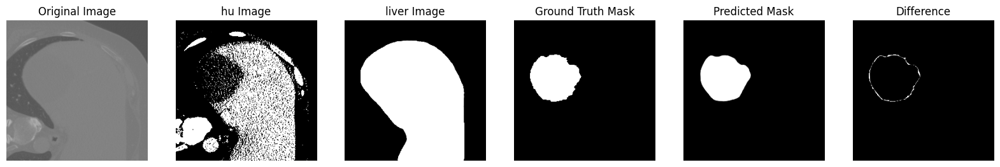

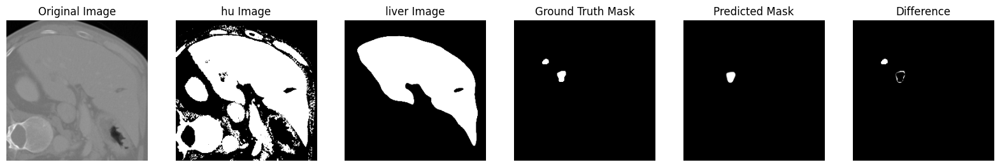

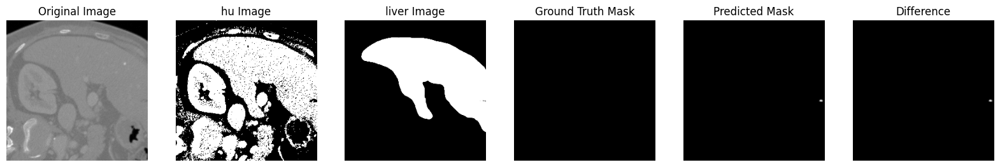

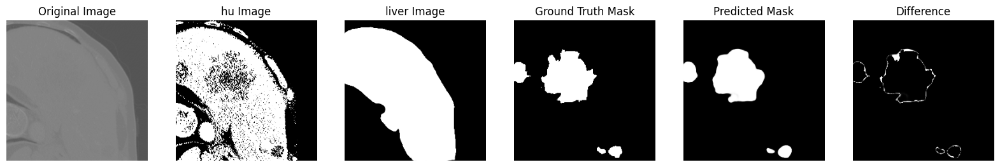

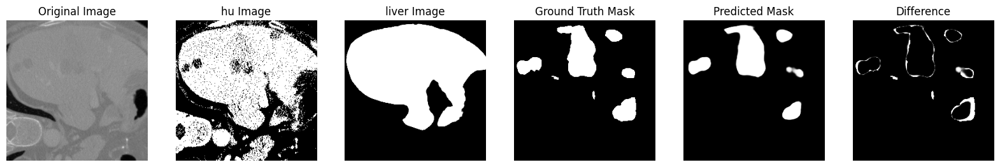

In [24]:
y_pred = model1.predict(X_test)  # assuming X_val is your validation/test data
for i in range(70,80):
    plot_results(X_test[i], y_test[i], y_pred[i])
for i in range(200,210):
    plot_results(X_test[i], y_test[i], y_pred[i])

Combining the outputs:

In [29]:
imagesToExculde = [47,38,34,41,32,50]
origMask = []
for i in range(images_count):
    # Load image and mask
    if (imagesToExculde.__contains__(i)): continue
    progress_bar(i,images_count)
    mask = load_nii_image(os.path.join(label_dir, f"segmentation-{i}.nii")).squeeze()  # Squeeze to reduce to 255x255

    for j in range(mask.shape[2]):
        # Process each slice of the mask
        mask_slice = mask[:,:,j]

        # Create a binary mask: 0 where mask is 0, 1 elsewhere
        binary_mask = np.where(mask_slice > 0.0, 1.0, 0.0)

        # Check if more than a certain threshold of values are non-zero in the binary mask
        if np.sum(binary_mask) / (mask_slice.shape[0] * mask_slice.shape[1]) > threshold:
            # Stack the image slice and the binary mask to create a 255x255x3 image
            origMask.append(mask_slice)  # Append the original mask slice if needed.
    print(len(origMask))
origMask = np.array(origMask)[..., np.newaxis]

|----------------------------------------------------------------------------------------------------| 0.00%
15
|█---------------------------------------------------------------------------------------------------| 1.96%
31
|███-------------------------------------------------------------------------------------------------| 3.92%
121
|█████-----------------------------------------------------------------------------------------------| 5.88%
196
|███████---------------------------------------------------------------------------------------------| 7.84%
320
|█████████-------------------------------------------------------------------------------------------| 9.80%
363
|███████████-----------------------------------------------------------------------------------------| 11.76%
424
|█████████████---------------------------------------------------------------------------------------| 13.73%
515
|███████████████--------------------------------------------------------------------------------

In [30]:
from matplotlib.colors import NoNorm
def plot_results(original, truth, prediction, origMask):


    fig, ax = plt.subplots(1,6, figsize=(20, 10))

    ax[0].imshow(original[:,:,0], cmap='gray',norm=NoNorm())
    ax[0].set_title("Original Image")

    ax[1].imshow(original[:,:,1], cmap='gray',norm=NoNorm())
    ax[1].set_title("hu Image")

    predicted_Liver = original[:,:,2].copy()
    predicted_Liver[predicted_Liver > 0.1] = 0.5
    ax[2].imshow(original[:,:,2], cmap='gray',norm=NoNorm())
    ax[2].set_title("liver Image")

    ax[3].imshow(truth[..., 0], cmap='gray',norm=NoNorm())
    ax[3].set_title("Ground Truth Mask")

    union = np.maximum(prediction[..., 0], predicted_Liver[..., 0])


    ax[4].imshow(union, cmap='gray',norm=NoNorm())
    ax[4].set_title("Predicted Mask - combind")

    ax[5].imshow(origMask, cmap='gray',norm=NoNorm())
    ax[5].set_title("Actual Mask")


    for a in ax:
        a.axis('off')

    plt.show()

In [31]:
len(origMask)

2737

In [32]:
_, _, _, actualMask = train_test_split(imagesc, origMask, test_size=0.2, random_state=42)

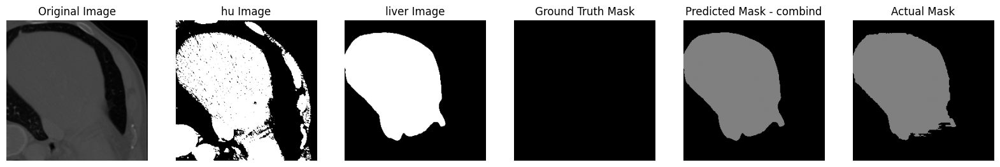

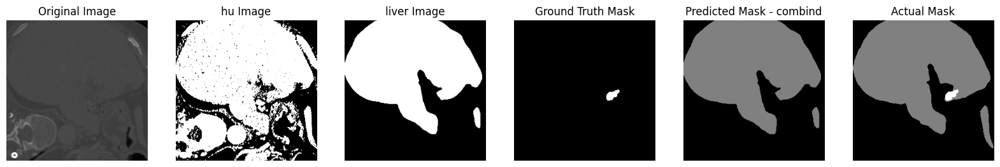

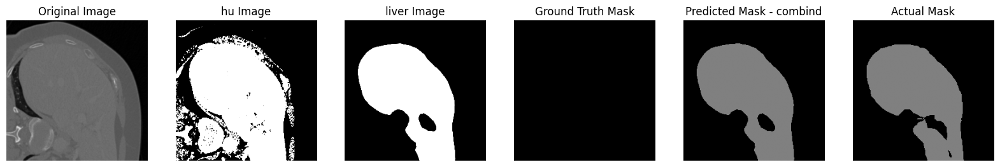

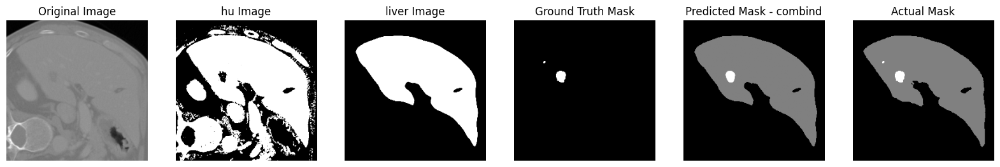

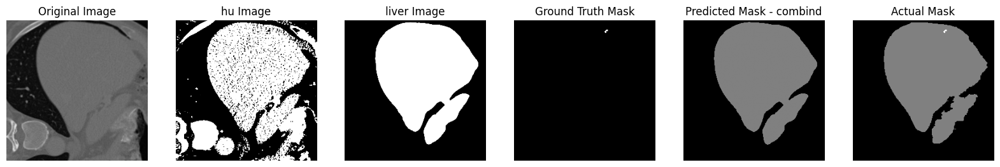

...

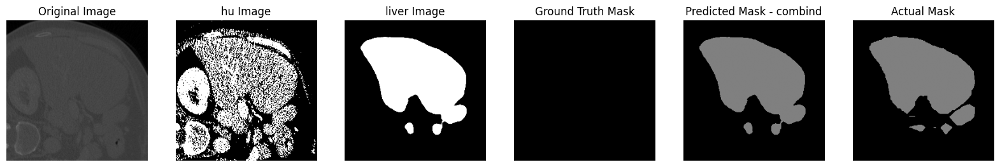

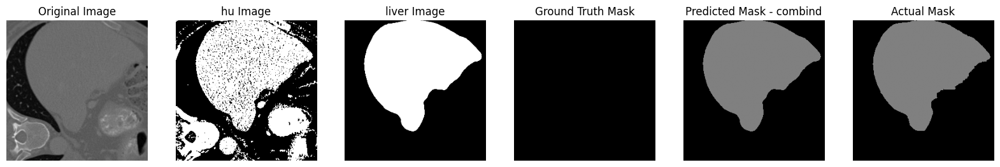

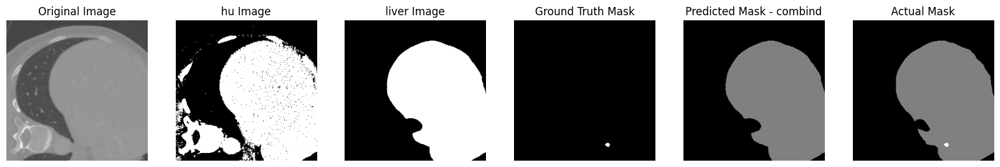

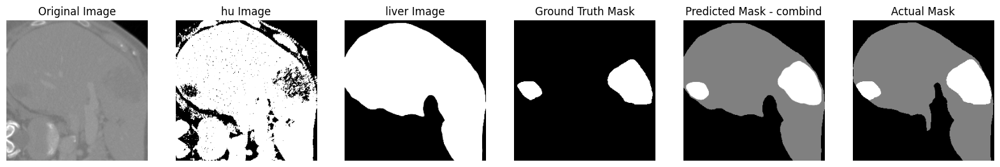

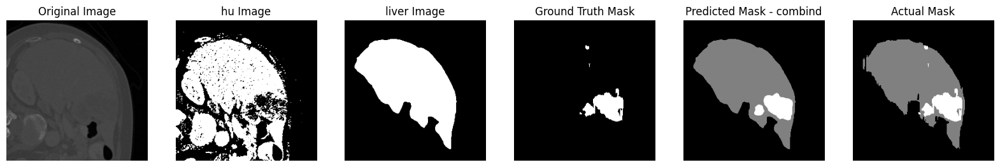

IndexError: index 548 is out of bounds for axis 0 with size 548

In [39]:

for i in range(500,550):
    plot_results(X_test[i], y_test[i], y_pred[i], actualMask[i])